# Visión por Computadora

In [ ]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

from pathlib import Path


In [ ]:
%matplotlib inline

### Coordenadas Cromáticas

In [ ]:
path = 'imgs/coord_cromaticas/CoordCrom_'

In [ ]:
def chromaticCoords(pImg):
    """
    Recibe una imagen y devuelve el descriptor
    aplicando la lógica del algoritmo de coordenadas cromáticas
    """

    # Convertir a float para evitar problemas con la división.
    img_float = pImg.astype(float)

    # Sumar a lo largo de la tercera dimensión (canales de color R+G+B)
    sum_channels = np.sum(img_float, axis=2, keepdims=True)

    # Evitar la división por cero
    # Si la suma es cero, el numerador será también cero
    # Por lo que, se reemplaza la suma por 1 (entero arbitrario)
    # El resultado será 0/1, y por lo tanto el valor final queda 0
    sum_channels_ok = np.where(sum_channels == 0, 1, sum_channels)

    # Crear la nueva matriz dividiendo cada valor por la suma de los canales
    normalized_img = img_float / sum_channels_ok

    # Convertir de vuelta a uint8
    normalized_img_uint8 = (normalized_img * 255).astype(np.uint8)

    # Devuelve el descriptor
    return normalized_img_uint8

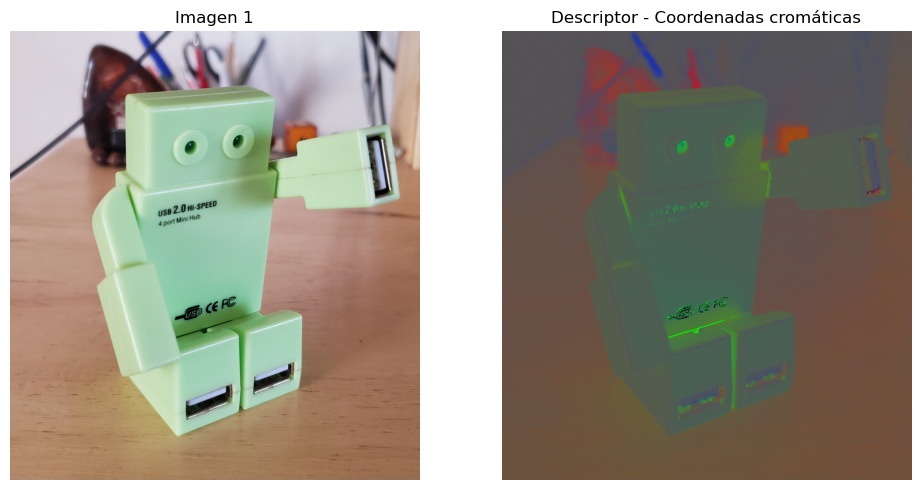

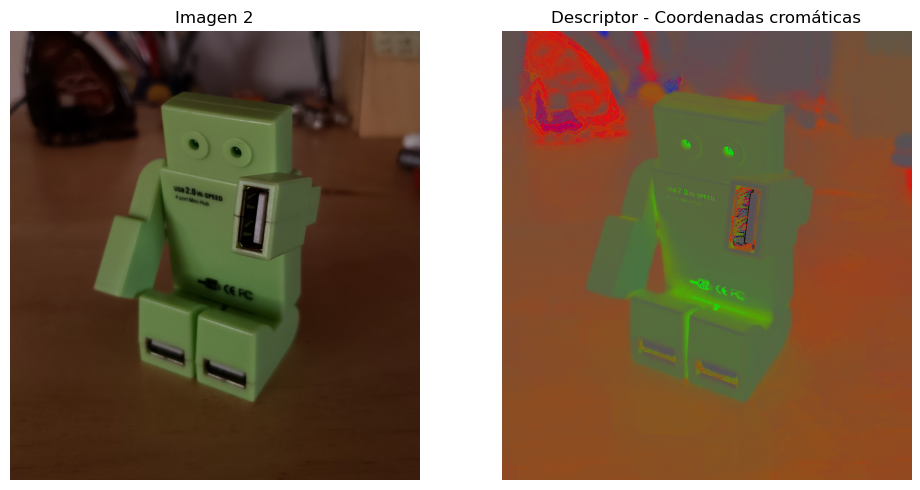

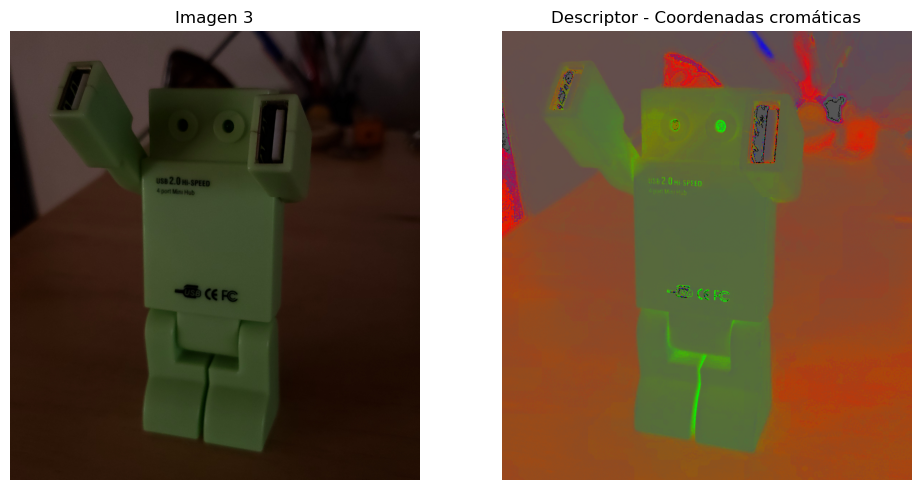

In [ ]:
# Recorrer de 1 a 3 para aplicar el mismo código a las 3 imágenes dadas
for i in range(1, 4):

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Leer en color y convertir a RGB
    img = cv.imread(path + str(i) + '.png')
    image_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

    # Mostrar la imagen original usando matplotlib
    axes[0].imshow(image_rgb)
    axes[0].axis('off')  # Oculta los ejes
    axes[0].set_title(f"Imagen {i}")

    # Aplicar el algoritmo de coordenadas cromáticas
    descriptor = chromaticCoords(image_rgb)

    # Mostrar el descriptor resultante
    axes[1].imshow(descriptor)
    axes[1].axis('off')  # Oculta los ejes
    axes[1].set_title('Descriptor - Coordenadas cromáticas')

    plt.tight_layout()
    plt.show()



### White Patch

In [ ]:
path = Path('imgs/white_patch/')
# Todos los archivos de la carpeta ordenados alfabéticamente
all_files = sorted(path.iterdir(), key=lambda p: p.name.lower())

In [ ]:
def whitePatch(pImg, p=100):
    """
    Recibe una imagen y devuelve
    otra aplicando balance de blancos

    p es por defecto 100 (para blanco puro)
    o bien, recibe un valor para aplicar percentil
    """

    # Convertir a float para evitar problemas con la división.
    img_float = pImg.astype(float)

    if p==100:
        # Valor por defecto
        # Encontrar el valor máximo en cada canal
        max_R = np.max(img_float[:, :, 0])
        max_G = np.max(img_float[:, :, 1])
        max_B = np.max(img_float[:, :, 2])
    else:
        # Calcular el percentil para cada canal según parámetro ingresado
        max_R = np.percentile(img_float[:, :, 0], p)
        max_G = np.percentile(img_float[:, :, 1], p)
        max_B = np.percentile(img_float[:, :, 2], p)

    img_mod = img_float.copy()
    img_mod[:, :, 0] = np.clip(img_mod[:, :, 0] * (255.0/max_R), 0, 255)
    img_mod[:, :, 1] = np.clip(img_mod[:, :, 1] * (255.0/max_G), 0, 255)
    img_mod[:, :, 2] = np.clip(img_mod[:, :, 2] * (255.0/max_B), 0, 255)

    # Devolver la imagen convertida de nuevo a uint8
    return img_mod.astype(np.uint8)


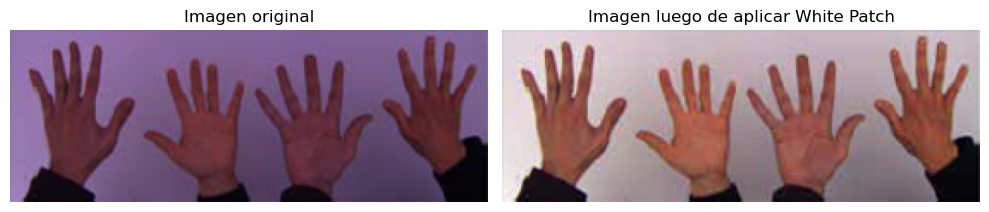

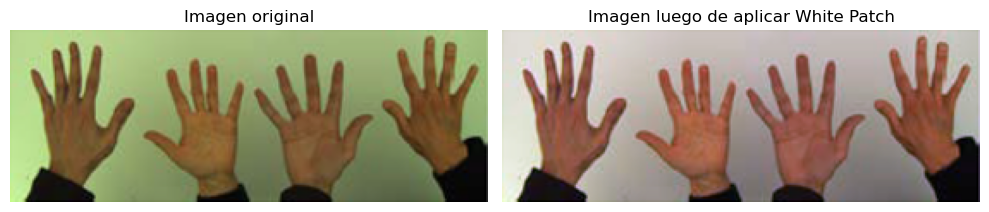

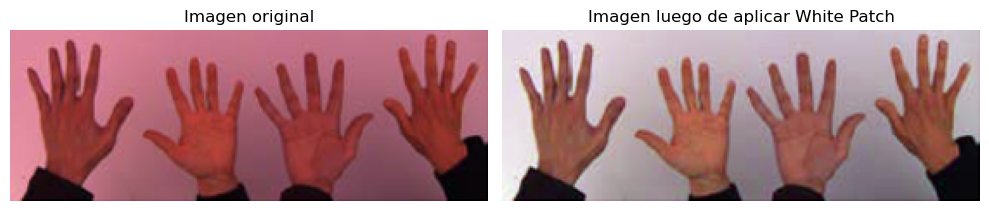

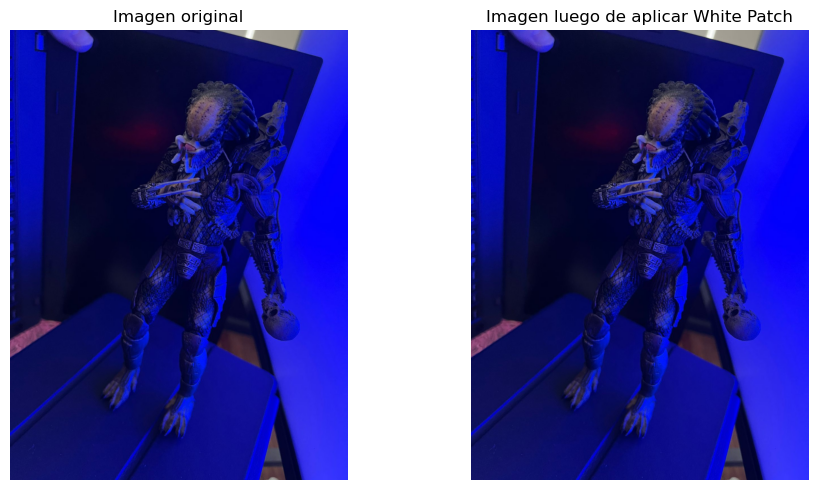

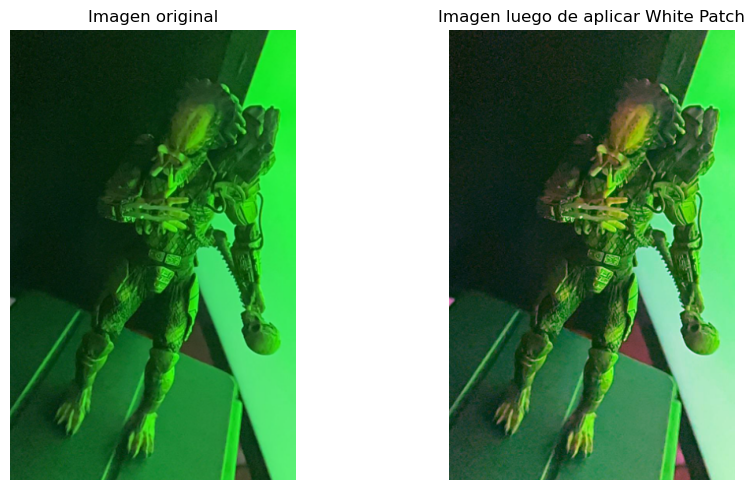

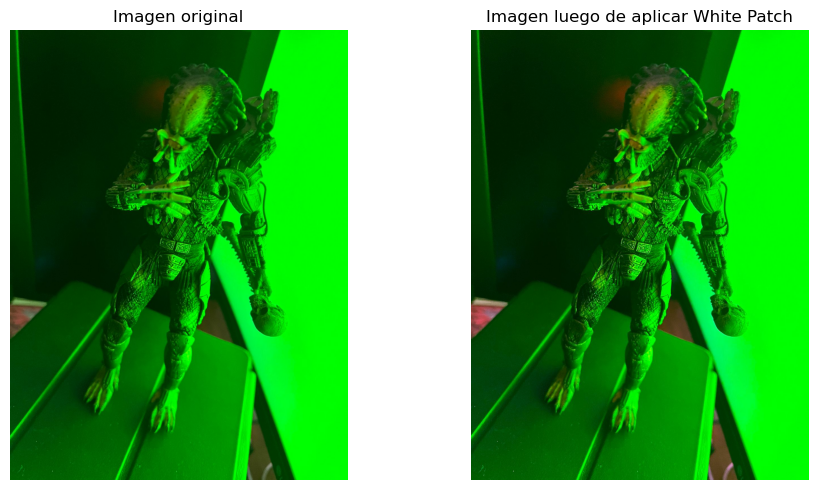

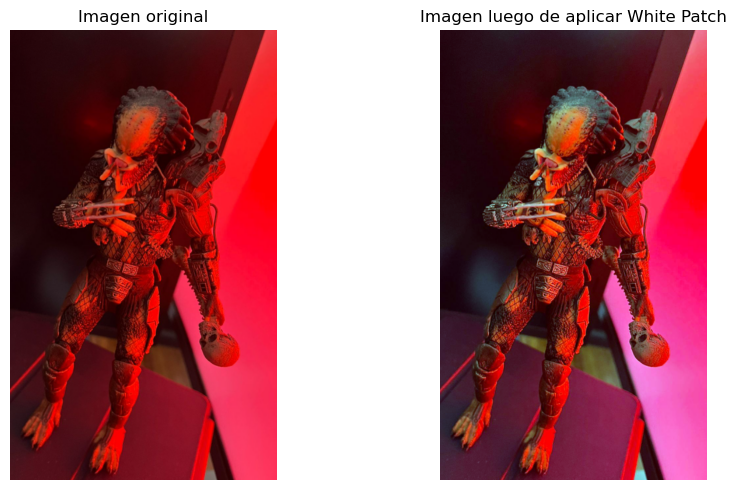

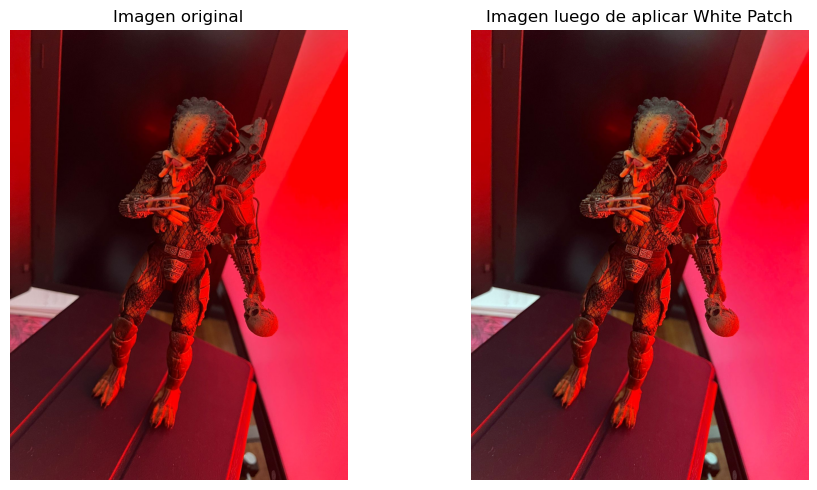

In [ ]:
# Recorrer todas las imágenes de la carpeta dada
for i in all_files:

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Leer en color y convertir a RGB
    img = cv.imread(i)
    image_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

    # Mostrar la imagen original usando matplotlib
    axes[0].imshow(image_rgb)
    axes[0].axis('off')  # Oculta los ejes
    axes[0].set_title(f"Imagen original")

    # Aplicar el algoritmo de balance de blancos
    new_img = whitePatch(image_rgb)

    # Mostrar la imagen resultante
    axes[1].imshow(new_img)
    axes[1].axis('off')  # Oculta los ejes
    axes[1].set_title('Imagen luego de aplicar White Patch')

    plt.tight_layout()
    plt.show()


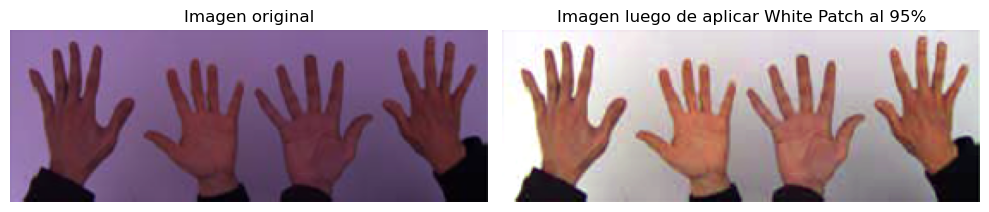

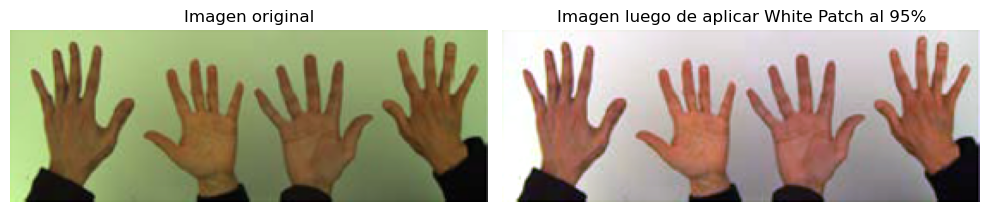

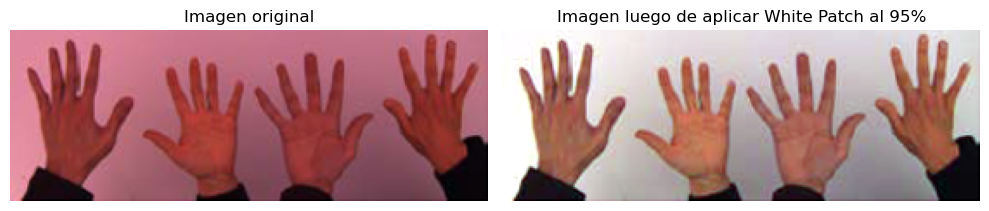

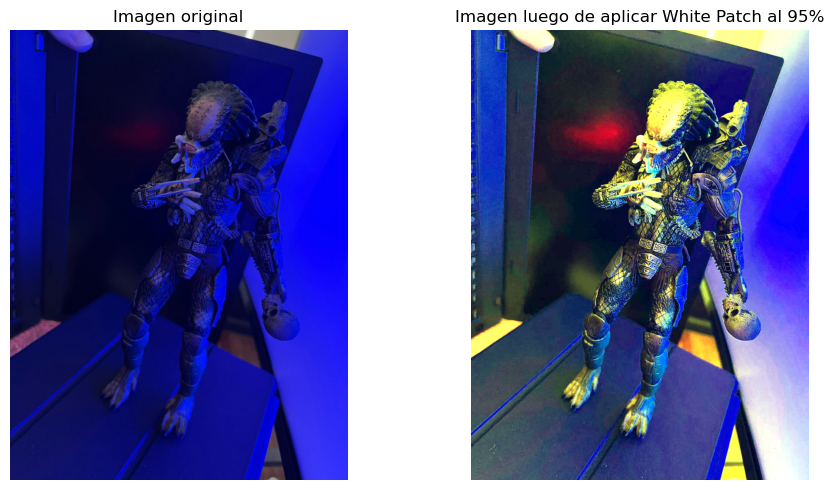

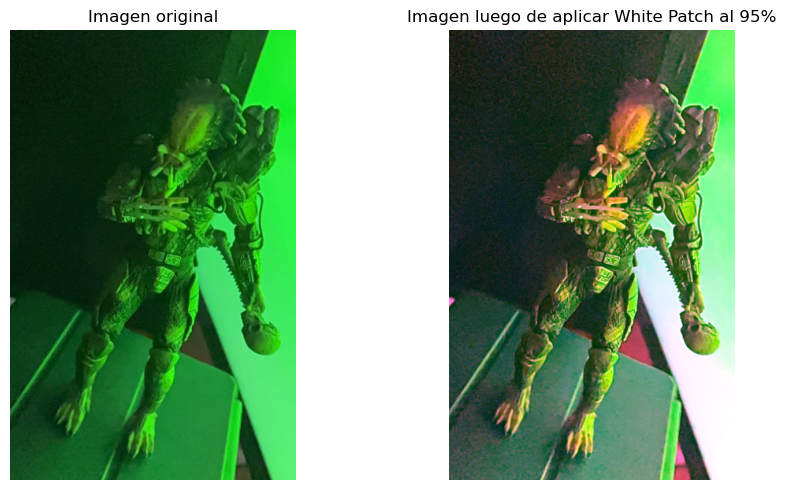

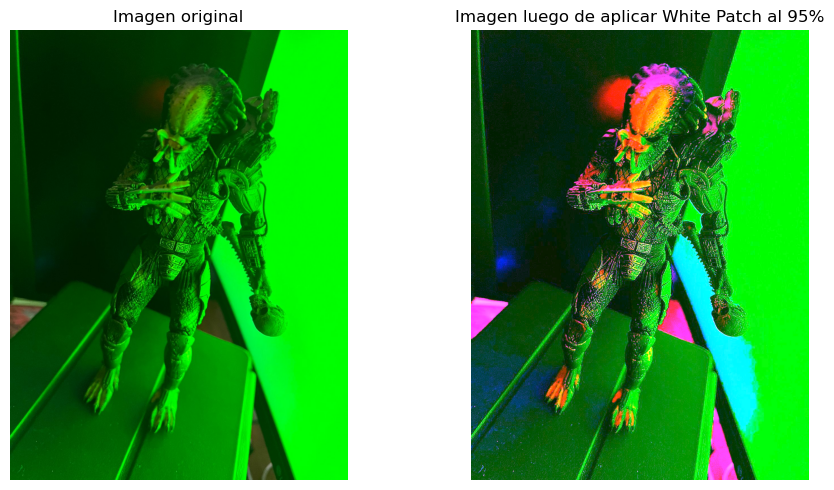

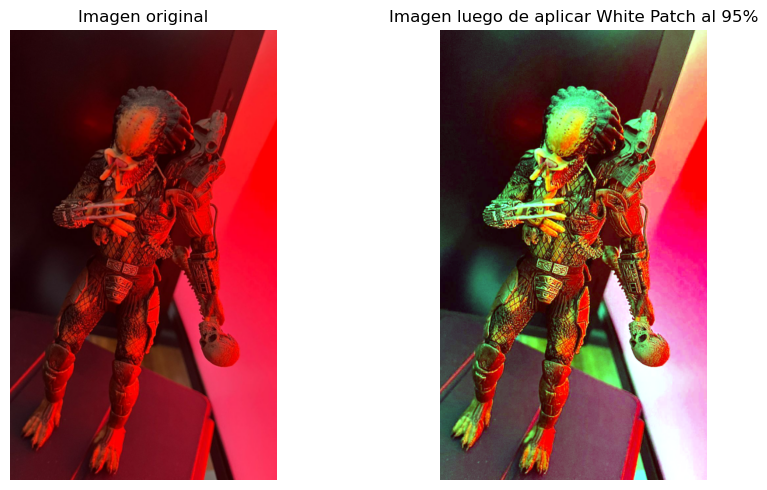

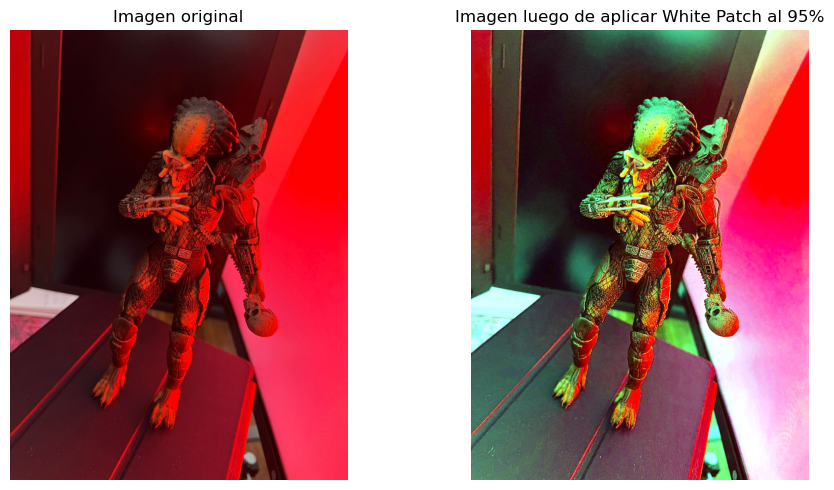

In [ ]:
# Recorrer todas las imágenes de la carpeta dada
for i in all_files:

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Leer en color y convertir a RGB
    img = cv.imread(i)
    image_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

    # Mostrar la imagen original usando matplotlib
    axes[0].imshow(image_rgb)
    axes[0].axis('off')  # Oculta los ejes
    axes[0].set_title(f"Imagen original")

    # Aplicar el algoritmo de balance de blancos
    new_img = whitePatch(image_rgb, 95)

    # Mostrar la imagen resultante
    axes[1].imshow(new_img)
    axes[1].axis('off')  # Oculta los ejes
    axes[1].set_title('Imagen luego de aplicar White Patch al 95%')

    plt.tight_layout()
    plt.show()

**Observaciones:**  
La imagen de las manos se corrige bien, sin embargo, la del depredador no.

In [ ]:
# Tomar sólo las imágenes que empiezan con 'wp'
wp_imgs = sorted(
    (file for file in path.iterdir() if file.name.startswith('wp')),
    key=lambda p: p.name.lower()
)

#### Análisis del histograma de la intensidad de cada canal

imgs/white_patch/wp_blue.jpg


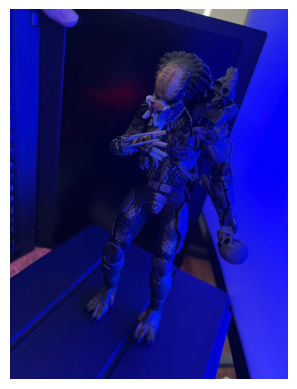

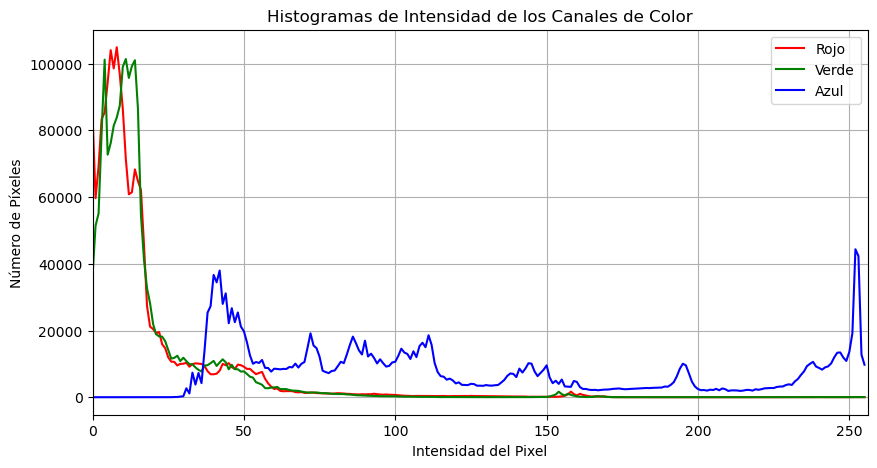

imgs/white_patch/wp_green.png


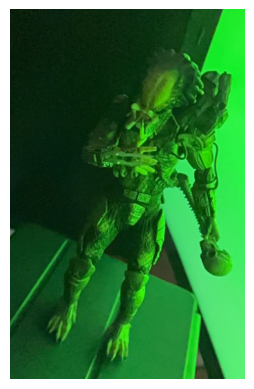

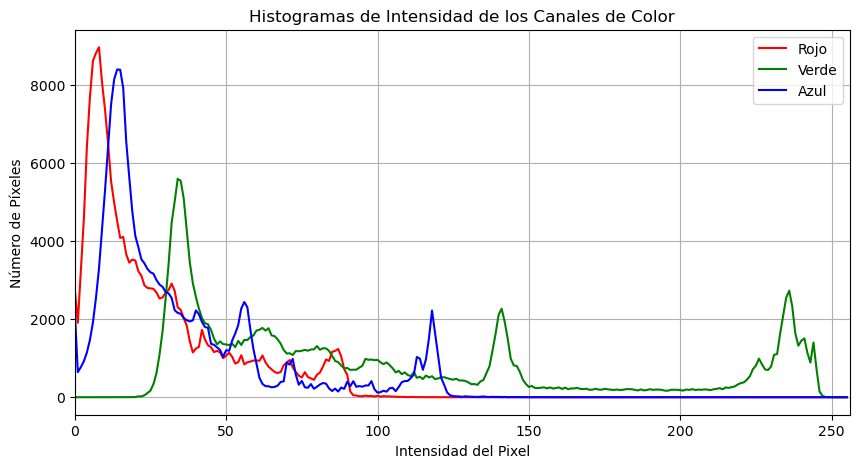

imgs/white_patch/wp_green2.jpg


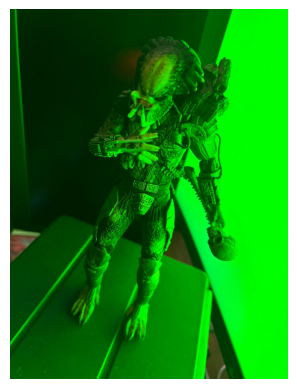

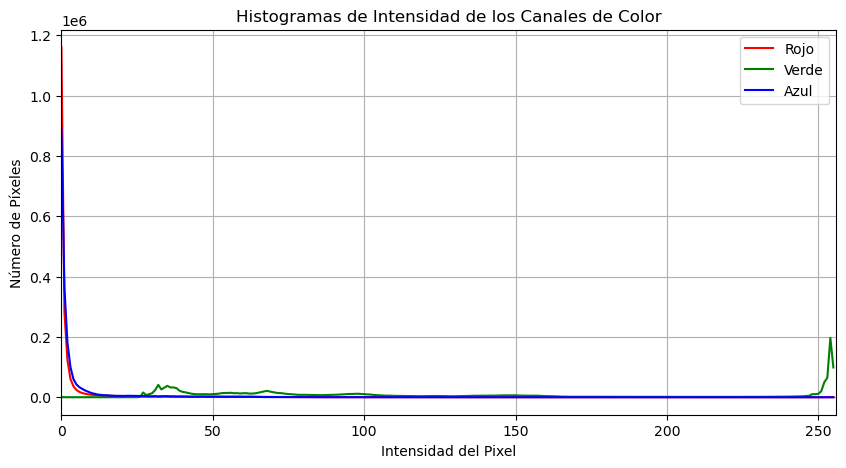

imgs/white_patch/wp_red.png


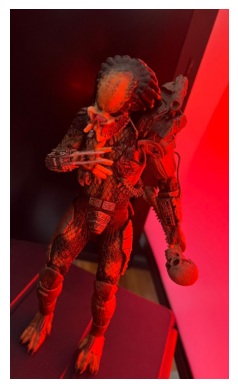

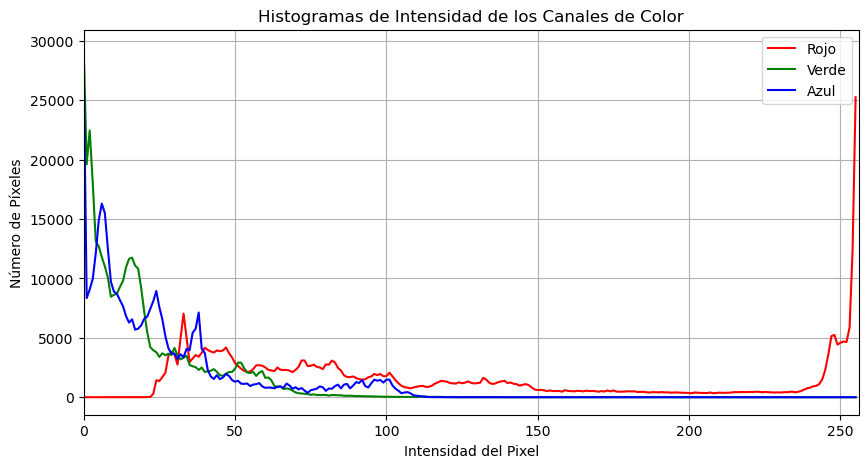

imgs/white_patch/wp_red2.jpg


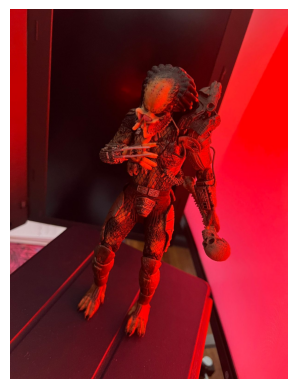

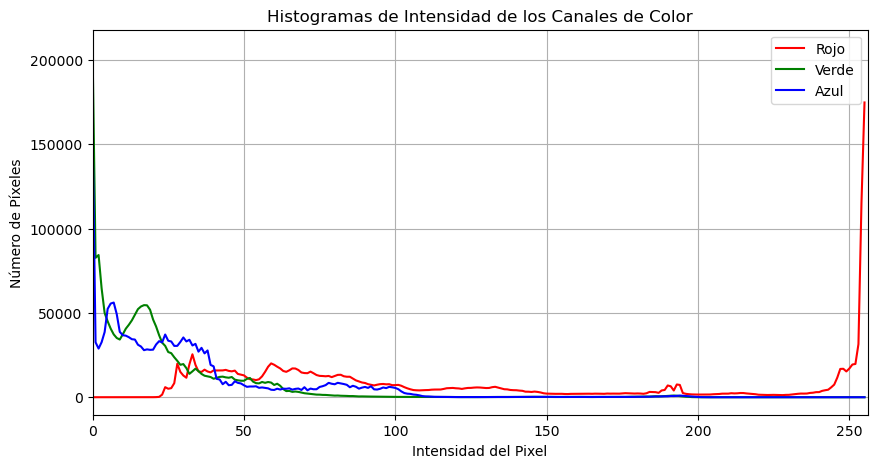

In [ ]:
for image in wp_imgs:

    print(image)
    # Leer en color y convertir a RGB
    img = cv.imread(image)
    image_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

    # Mostrar la imagen original usando matplotlib
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.show()

    # Extraer cada canal
    red_channel = image_rgb[:, :, 0]
    green_channel = image_rgb[:, :, 1]
    blue_channel = image_rgb[:, :, 2]

    # Calcular el histograma de cada canal
    hist_red, bins_red = np.histogram(red_channel.ravel(), 256, [0, 256])
    hist_green, bins_green = np.histogram(green_channel.ravel(), 256, [0, 256])
    hist_blue, bins_blue = np.histogram(blue_channel.ravel(), 256, [0, 256])

    # Graficar los histogramas
    plt.figure(figsize=(10, 5))

    plt.plot(bins_red[:-1], hist_red, color='red', label='Rojo')
    plt.plot(bins_green[:-1], hist_green, color='green', label='Verde')
    plt.plot(bins_blue[:-1], hist_blue, color='blue', label='Azul')

    plt.title('Histogramas de Intensidad de los Canales de Color')
    plt.xlabel('Intensidad del Pixel')
    plt.ylabel('Número de Píxeles')
    plt.xlim([0, 256])
    plt.legend()
    plt.grid(True)
    plt.show()

**Conclusiones**  

Las imágenes están iluminadas con una luz que tiene un sesgo importante de color.
Esta luz afecta todos los colores en la imagen, no sólo los blancos, haciendo que las áreas blancas en realidad tengan un tinte de color.
En consecuencia, el algoritmo identifica de manera incorrecta algunas áreas de la imagen y aplica una corrección que no neutraliza correctamente el sesgo de color de la luz.  

El valor más brillante que el algoritmo puede identificar no representa blanco puro, si no que, se ve fuertemente influenciada por el color de la luz.

En los histogramas se observa que, uno de los canales siempre es más uniforme que los otros dos, que presentan picos importantes al inicio.
Los picos al inicio de los histogramas de un canal, sugieren que hay muchas áreas en la imagen con valores bajos en ese canal, es decir, tonos muy oscuros, alejados del blanco puro.

La imagen corregida se presenta al ojo humano como no natural y con colores aún alterados.
Por lo tanto, para este set de imágenes en particular, el algoritmo no resulta del todo efectivo.

### Escala de grises - Histogramas

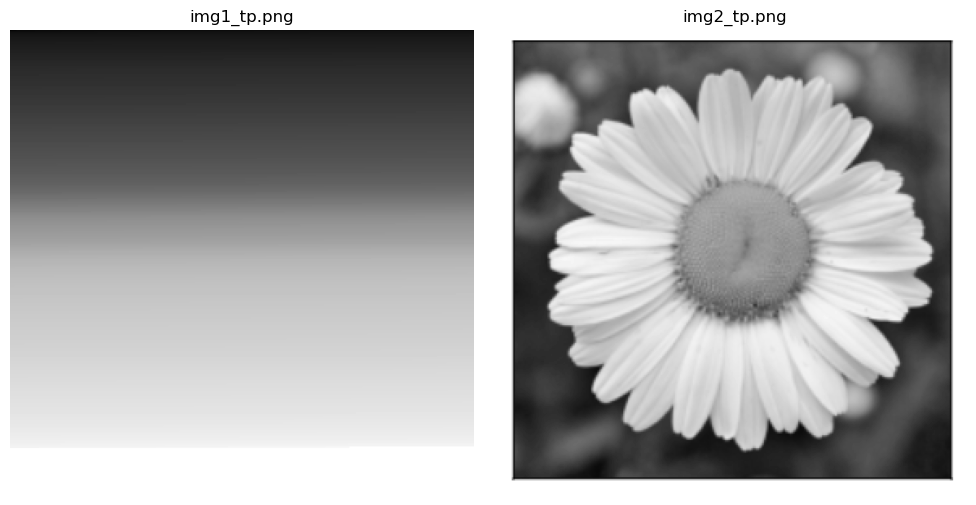

In [ ]:
path = 'imgs/'

# Leer en escala de grises
img1 = cv.imread(path + 'img1_tp.png', cv.IMREAD_GRAYSCALE)
img2 = cv.imread(path + 'img2_tp.png', cv.IMREAD_GRAYSCALE)

# Visualizar con Matplotlib
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img1, cmap='gray')
plt.title('img1_tp.png')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img2, cmap='gray')
plt.title('img2_tp.png')
plt.axis('off')

plt.tight_layout()
plt.show()


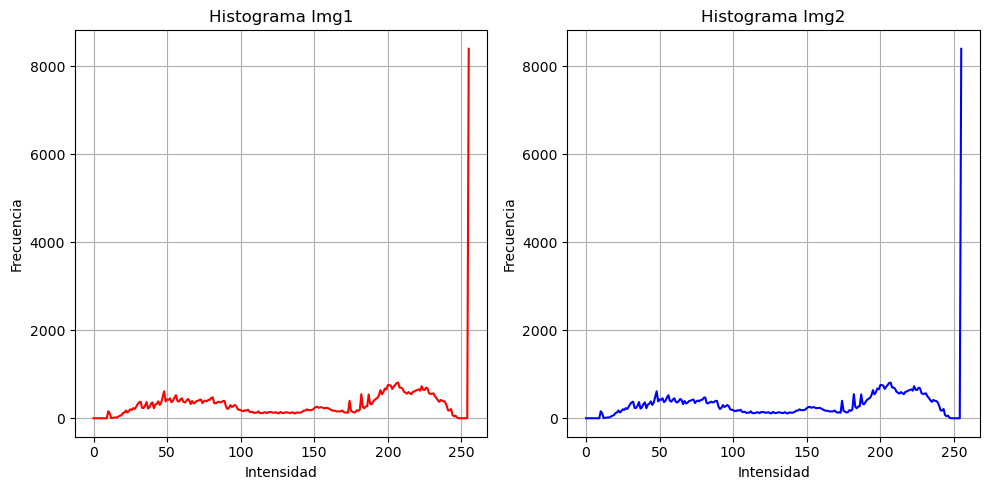

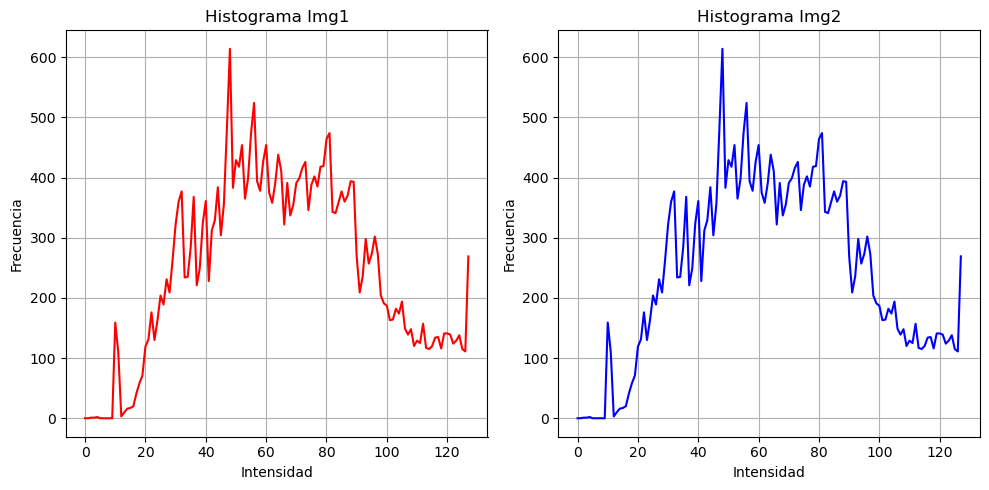

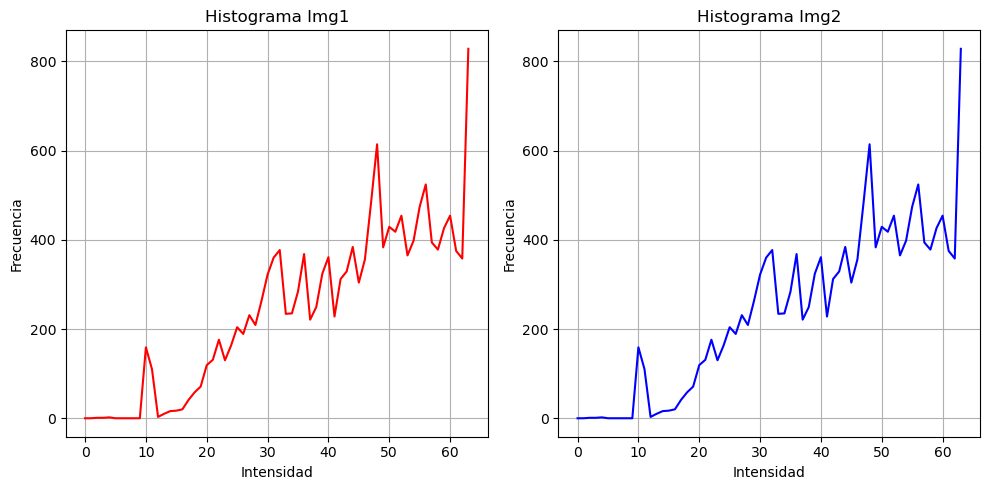

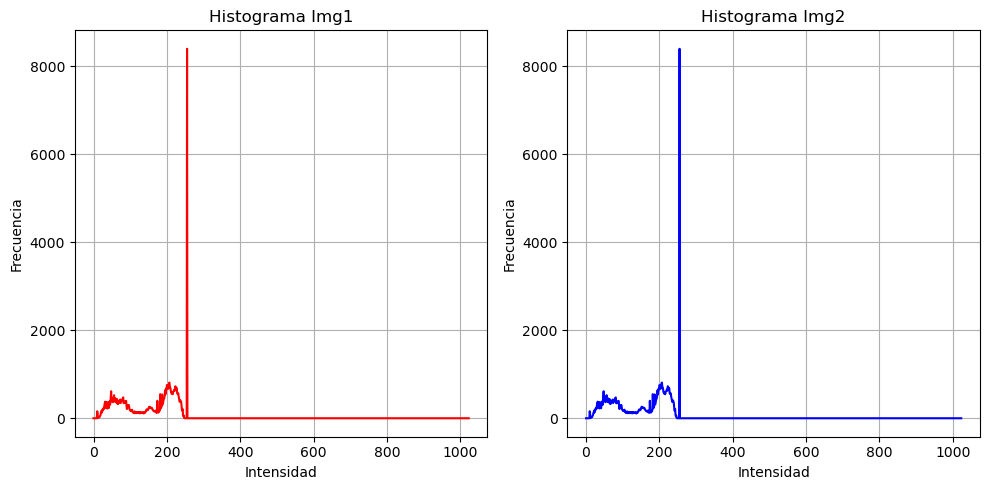

In [ ]:
# Explorar diferentes números de bins
num_bins_arr = [256, 128, 64, 1024]

# Calcular el histograma
for num_bins in num_bins_arr:

    hist1, bins1 = np.histogram(img1.ravel(), bins=num_bins, range=[0, num_bins])
    hist2, bins2 = np.histogram(img2.ravel(), bins=num_bins, range=[0, num_bins])

    # Mostrar histogramas
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.plot(hist1, color='red')
    plt.title('Histograma Img1')
    plt.xlabel('Intensidad')
    plt.ylabel('Frecuencia')
    plt.grid(True)

    # Segundo histograma (Columna 2)
    plt.subplot(1, 2, 2)
    plt.plot(hist2, color='blue')
    plt.title('Histograma Img2')
    plt.xlabel('Intensidad')
    plt.ylabel('Frecuencia')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

**Observaciones:**  
Los histogramas de ambas imágenes son iguales.

In [ ]:
hist1, bins1 = np.histogram(img1.ravel(), bins=256, range=[0, 256])
hist2, bins2 = np.histogram(img2.ravel(), bins=256, range=[0, 256])
print(np.array_equal(hist1, hist2))

True


**Conclusiones**  
En este caso, para un modelo de clasificación/detección de imágenes el histograma no aporta información suficiente que permita distinguir una imagen de otra.  
Será preciso considerar otras características de la imagen (texturas, formas, etc.) para que el modelo funcione adecuadamente.


### Segmentación

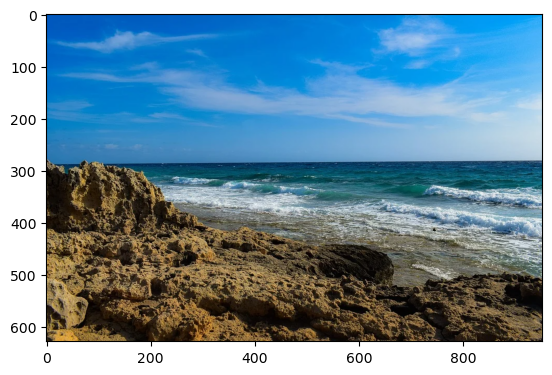

In [ ]:
# Leer en color y pasar a RGB
img = cv.imread(path + 'segmentacion.png')
image_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.imshow(image_rgb)
plt.show()

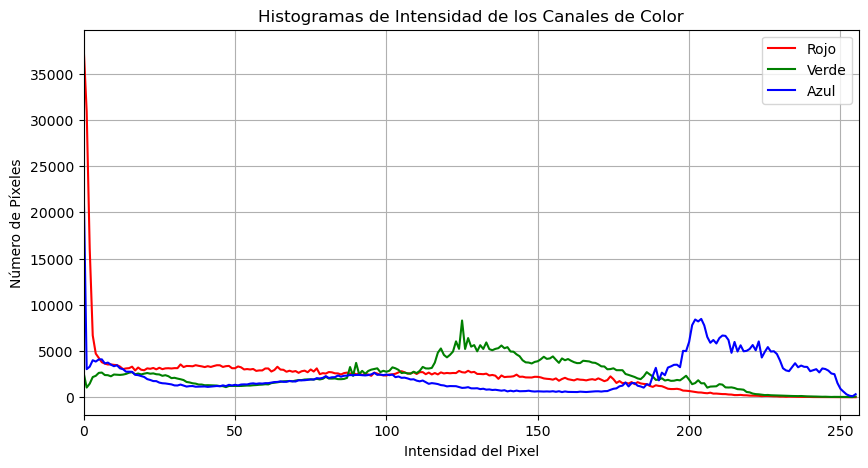

In [ ]:
# Extraer cada canal
red_channel = image_rgb[:, :, 0]
green_channel = image_rgb[:, :, 1]
blue_channel = image_rgb[:, :, 2]

# Calcular el histograma de cada canal
hist_red, bins_red = np.histogram(red_channel.ravel(), 256, [0, 256])
hist_green, bins_green = np.histogram(green_channel.ravel(), 256, [0, 256])
hist_blue, bins_blue = np.histogram(blue_channel.ravel(), 256, [0, 256])

# Graficar los histogramas
plt.figure(figsize=(10, 5))

plt.plot(bins_red[:-1], hist_red, color='red', label='Rojo')
plt.plot(bins_green[:-1], hist_green, color='green', label='Verde')
plt.plot(bins_blue[:-1], hist_blue, color='blue', label='Azul')

plt.title('Histogramas de Intensidad de los Canales de Color')
plt.xlabel('Intensidad del Pixel')
plt.ylabel('Número de Píxeles')
plt.xlim([0, 256])
plt.legend()
plt.grid(True)
plt.show()

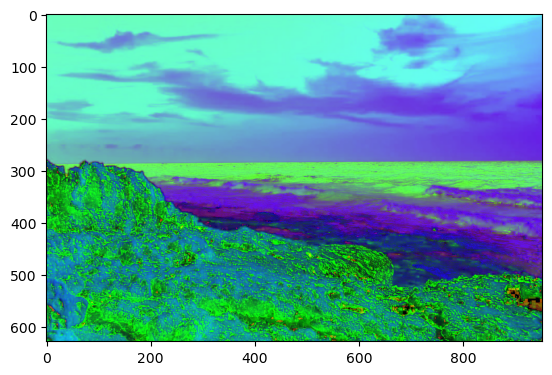

In [ ]:
# Segmentar agua, cielo y tierra
image_hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
plt.imshow(image_hsv)
plt.show()

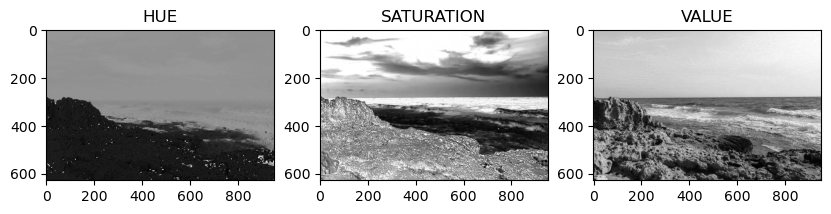

In [ ]:
# Separación de canales
im_h, im_s, im_v = cv.split(image_hsv)

plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(im_h, cmap='gray')
plt.title("HUE")

plt.subplot(1, 3, 2)
plt.imshow(im_s,cmap='gray')
plt.title("SATURATION")

plt.subplot(1, 3, 3)
plt.imshow(im_v,cmap='gray')
plt.title("VALUE")

plt.show()

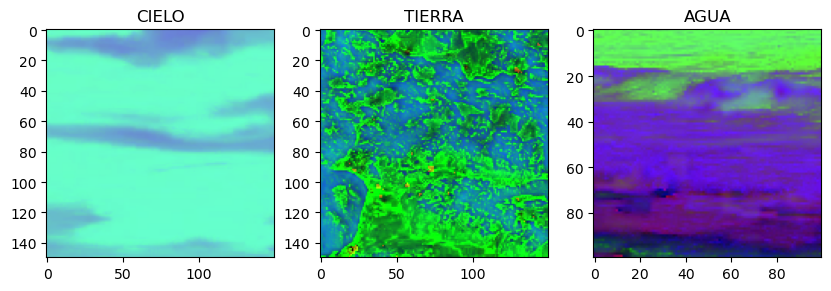

In [ ]:
# Tomar muestras de las secciones
m_c = image_hsv[50:200, 50:200, :]
m_t = image_hsv[450:600, 50:200, :]
m_a = image_hsv[300:400, 300:400, :]


plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(m_c)
plt.title("CIELO")

plt.subplot(1, 3, 2)
plt.imshow(m_t)
plt.title("TIERRA")

plt.subplot(1, 3, 3)
plt.imshow(m_a)
plt.title("AGUA")

plt.show()

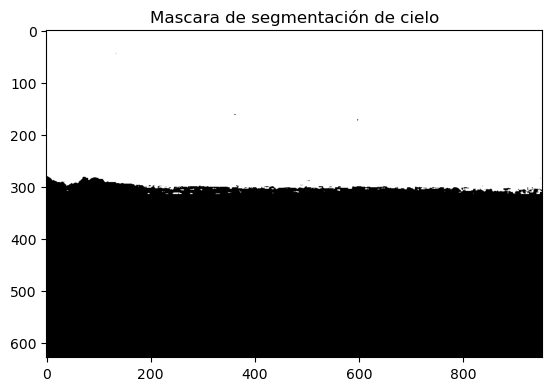

In [ ]:
# Región de interés - Cielo
roi_cielo = image_hsv[0:250, 0:, :]
mean_hue_cielo, _, _ = np.mean(roi_cielo, axis=(0,1))
std_hue_cielo, _, _ = np.std(roi_cielo, axis=(0,1))

lowb = (mean_hue_cielo-std_hue_cielo*3, 0, 0)
upperb = (mean_hue_cielo+std_hue_cielo*3, 255, 255)
mask_c = cv.inRange(image_hsv, lowb,  upperb)
# No se discrimina adecuadamente el cielo del agua en algunas partes por la similitud de colores
# Eliminamos el ruido del agua para segmentar correctamente
mask_c[315:, :] = 0
plt.imshow(mask_c, cmap='gray')
plt.title('Mascara de segmentación de cielo')
plt.show()

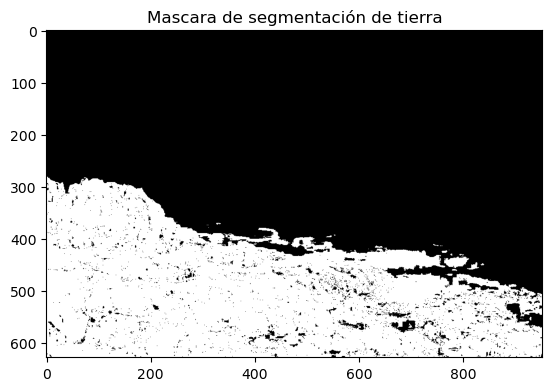

In [ ]:
# Región de interés - Tierra
roi_tierra = image_hsv[400:, 0:200, :]
mean_hue_tierra, _, _ = np.mean(roi_tierra, axis=(0,1))
std_hue_tierra, _, _ = np.std(roi_tierra, axis=(0,1))

lowb = (mean_hue_tierra-std_hue_tierra, 0, 0)
upperb = (mean_hue_tierra+std_hue_tierra, 255, 255)
mask_t = cv.inRange(image_hsv, lowb,  upperb)
plt.imshow(mask_t, cmap='gray')
plt.title('Mascara de segmentación de tierra')
plt.show()

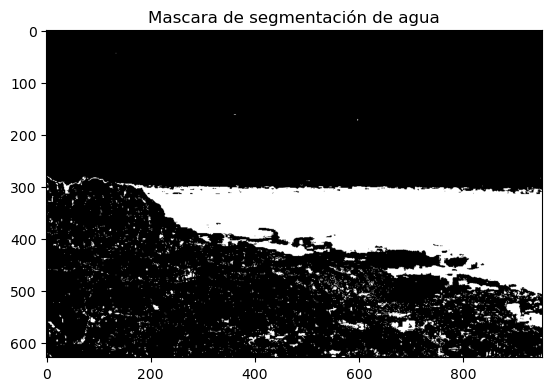

In [ ]:
# Región de interés - Agua
mask_a = np.zeros(mask_c.shape)
# Complemento de cielo y tierra
mask_a[mask_c == 0] = 255
mask_a[mask_t == 255] = 0
plt.imshow(mask_a, cmap='gray')
plt.title('Mascara de segmentación de agua')
plt.show()

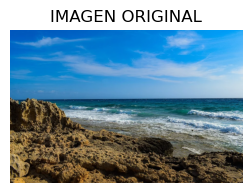

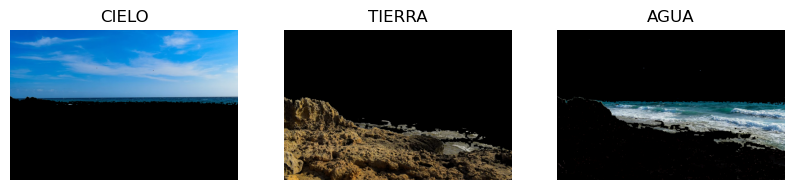

In [ ]:
img_segmentada_c = cv.bitwise_and(image_rgb, image_rgb, mask=(mask_c/ 255).astype(np.uint8))
img_segmentada_t = cv.bitwise_and(image_rgb, image_rgb, mask=(mask_t/ 255).astype(np.uint8))
img_segmentada_a = cv.bitwise_and(image_rgb, image_rgb, mask=(mask_a/ 255).astype(np.uint8))

plt.figure(figsize=(10//3, 5))
plt.imshow(image_rgb)
plt.axis('off')
plt.title("IMAGEN ORIGINAL")

plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(img_segmentada_c)
plt.axis('off')
plt.title("CIELO")

plt.subplot(1, 3, 2)
plt.imshow(img_segmentada_t)
plt.axis('off')
plt.title("TIERRA")

plt.subplot(1, 3, 3)
plt.imshow(img_segmentada_a)
plt.axis('off')
plt.title("AGUA")

plt.show()